In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import pickle
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
train_data = pd.read_csv("data/train - train.csv")

In [3]:
print("Dataset Overview:")
print(train_data.info())

Dataset Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             1995 non-null   float64
 5   four_g         1995 non-null   float64
 6   int_memory     1995 non-null   float64
 7   m_dep          1995 non-null   float64
 8   mobile_wt      1996 non-null   float64
 9   n_cores        1996 non-null   float64
 10  pc             1995 non-null   float64
 11  px_height      1996 non-null   float64
 12  px_width       1998 non-null   float64
 13  ram            1998 non-null   float64
 14  sc_h           1999 non-null   float64
 15  sc_w           1999 non-null   float64
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int

In [4]:
print("\nMissing Values:")
print(train_data.isnull().sum())


Missing Values:
battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               5
four_g           5
int_memory       5
m_dep            5
mobile_wt        4
n_cores          4
pc               5
px_height        4
px_width         2
ram              2
sc_h             1
sc_w             1
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64


In [5]:
print("Summary Statistics:")
print(train_data.describe())

Summary Statistics:
       battery_power       blue  clock_speed     dual_sim           fc  \
count    2000.000000  2000.0000  2000.000000  2000.000000  1995.000000   
mean     1238.518500     0.4950     1.522250     0.509500     4.310276   
std       439.418206     0.5001     0.816004     0.500035     4.335766   
min       501.000000     0.0000     0.500000     0.000000     0.000000   
25%       851.750000     0.0000     0.700000     0.000000     1.000000   
50%      1226.000000     0.0000     1.500000     1.000000     3.000000   
75%      1615.250000     1.0000     2.200000     1.000000     7.000000   
max      1998.000000     1.0000     3.000000     1.000000    19.000000   

            four_g   int_memory        m_dep    mobile_wt      n_cores  ...  \
count  1995.000000  1995.000000  1995.000000  1996.000000  1996.000000  ...   
mean      0.521303    32.048120     0.502256   140.266533     4.518036  ...   
std       0.499671    18.146476     0.288530    35.384676     2.288946  ... 

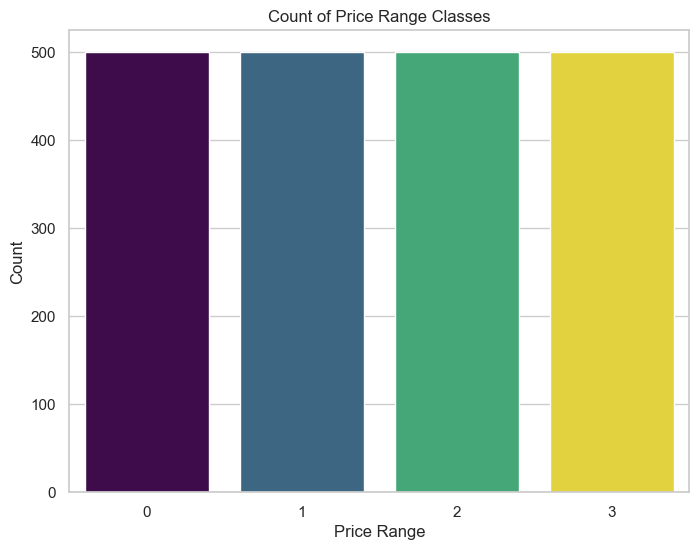

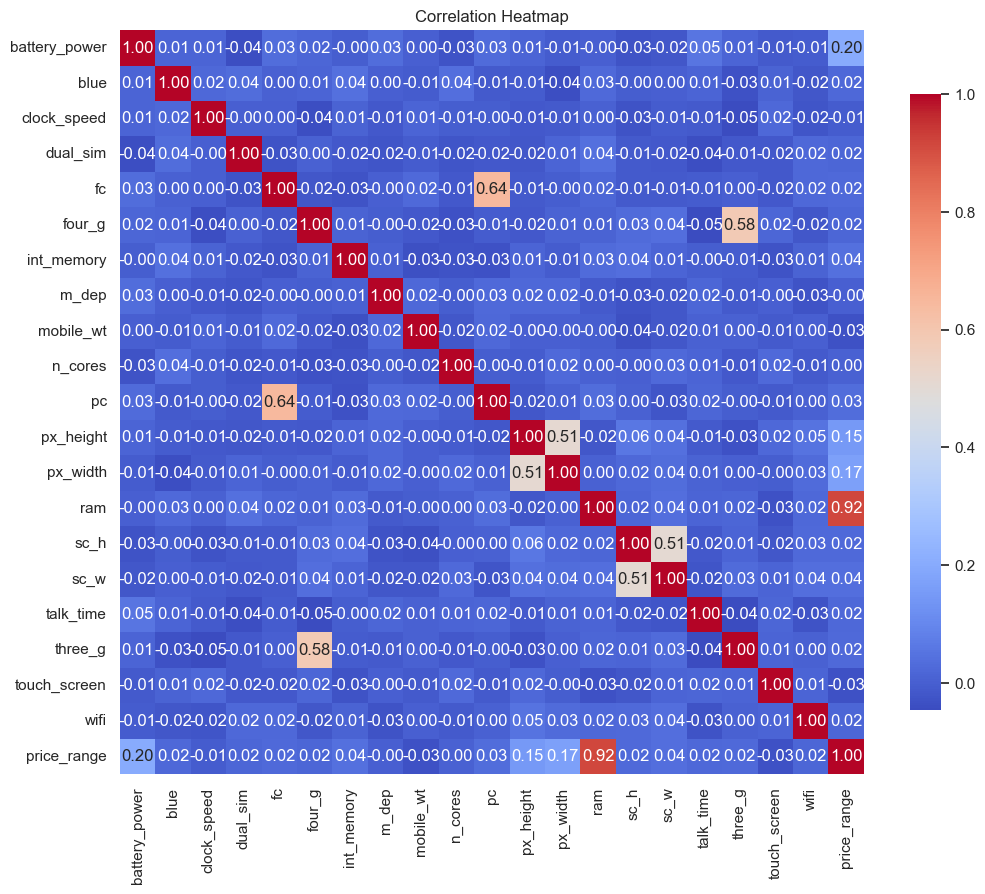

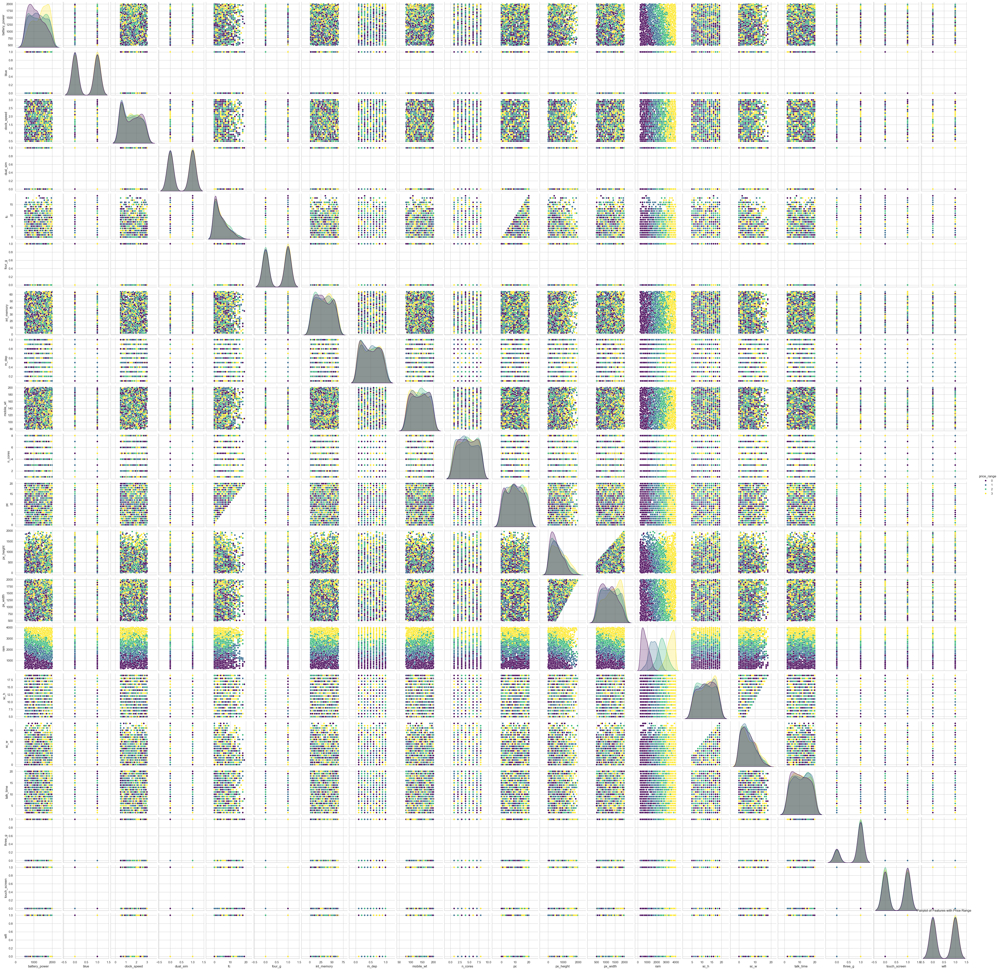

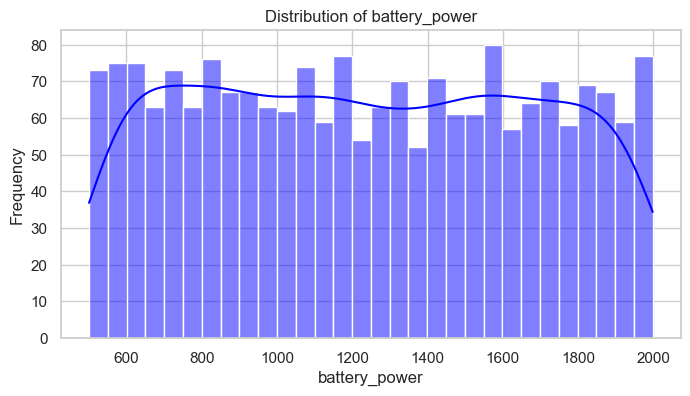

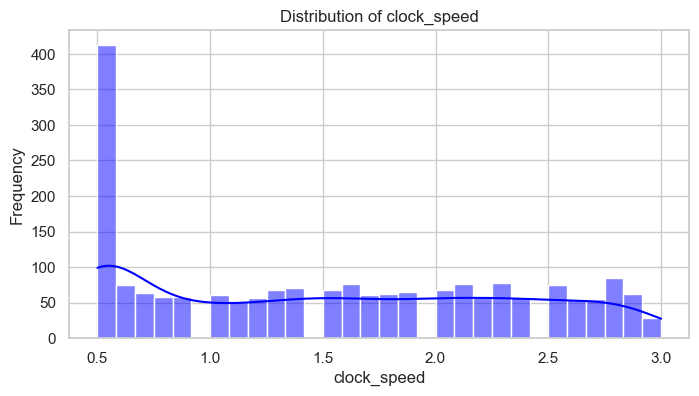

...

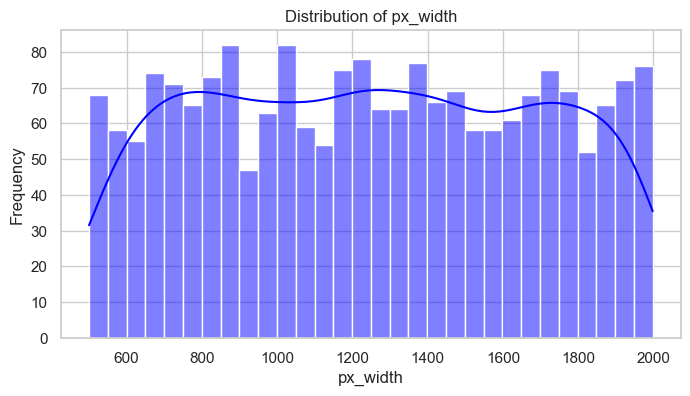

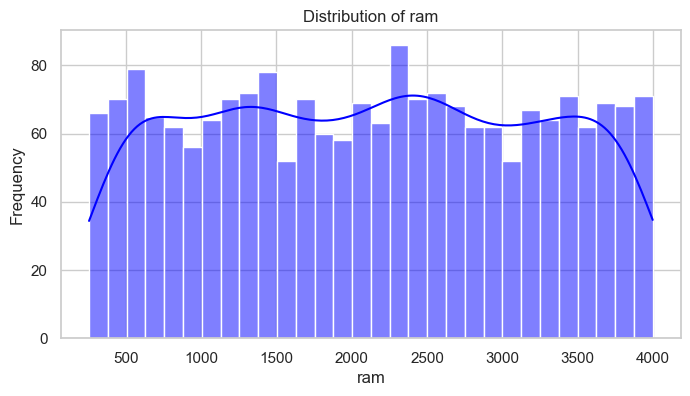

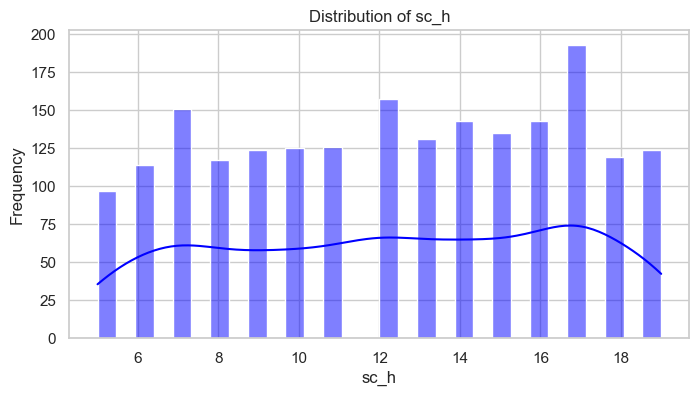

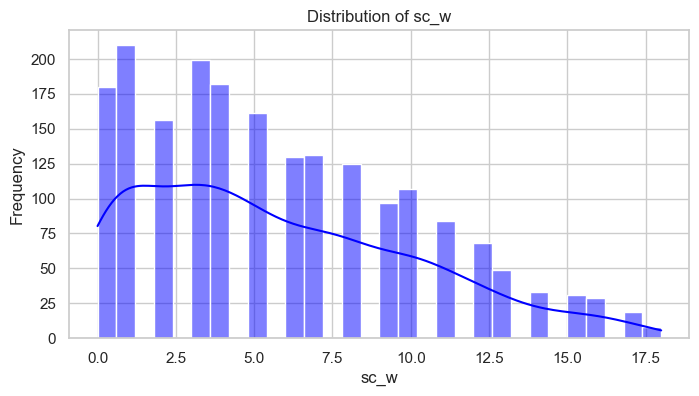

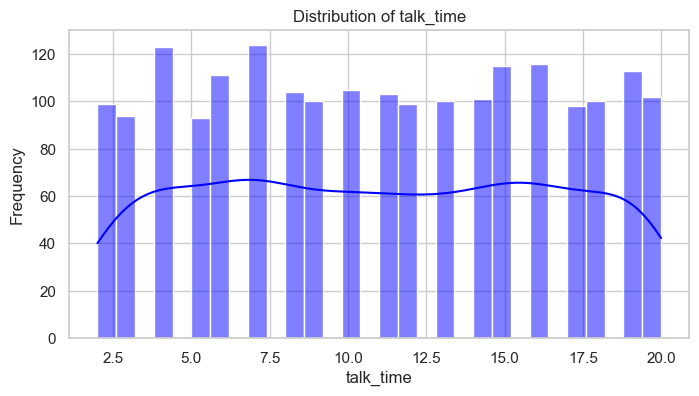

C:\Users\pc\AppData\Local\Temp\ipykernel_23480\317954072.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_data, x='price_range', y=col, palette='viridis')


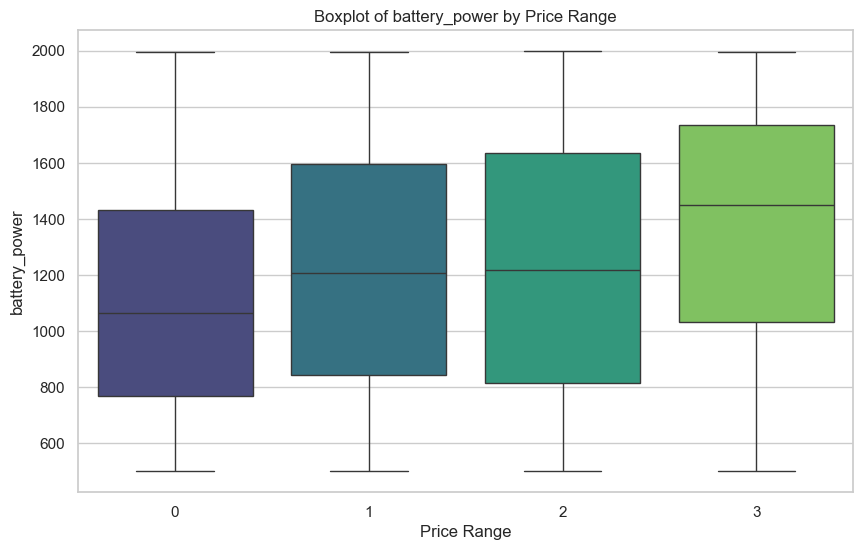

C:\Users\pc\AppData\Local\Temp\ipykernel_23480\317954072.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_data, x='price_range', y=col, palette='viridis')


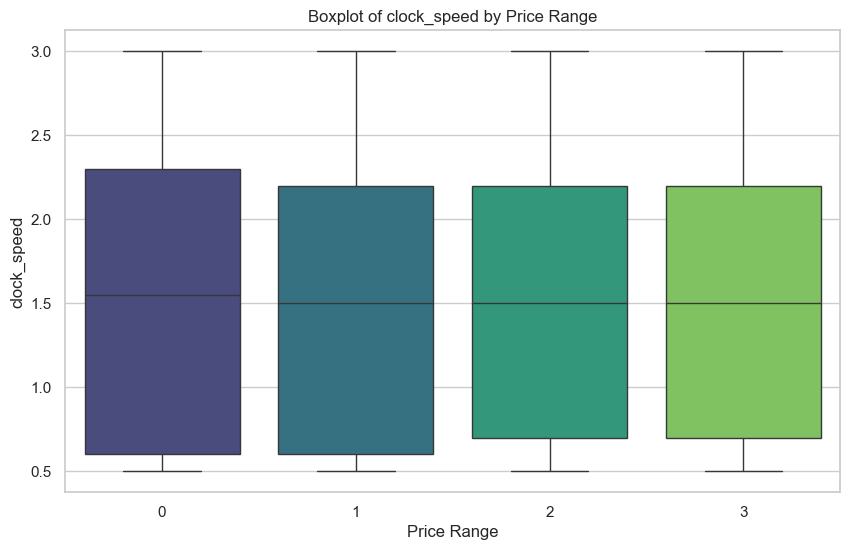

C:\Users\pc\AppData\Local\Temp\ipykernel_23480\317954072.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_data, x='price_range', y=col, palette='viridis')


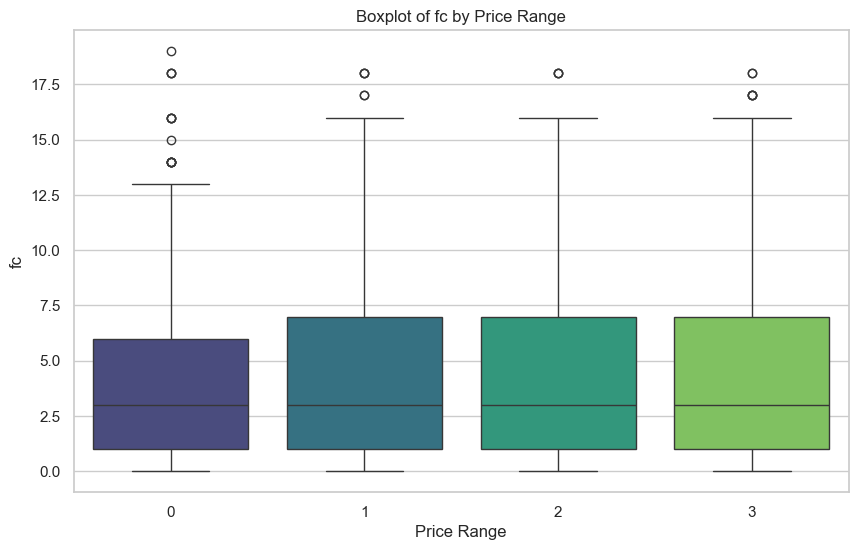

C:\Users\pc\AppData\Local\Temp\ipykernel_23480\317954072.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_data, x='price_range', y=col, palette='viridis')


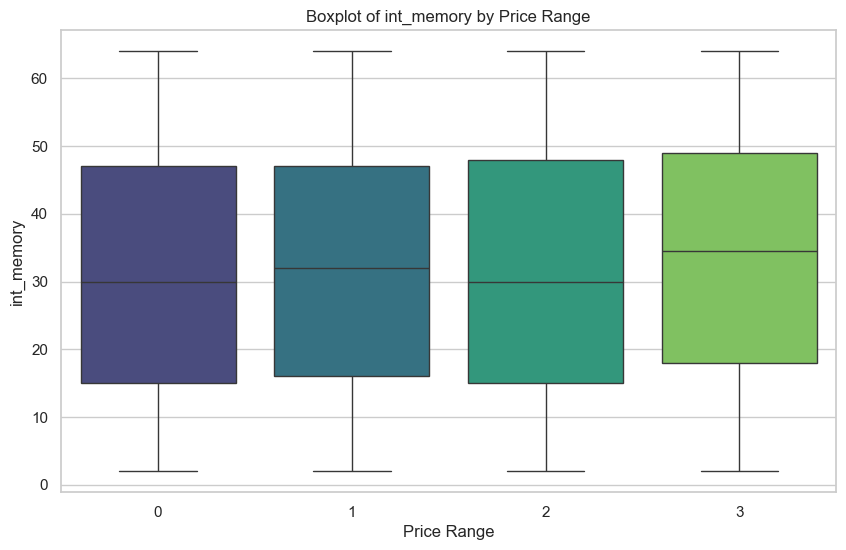

C:\Users\pc\AppData\Local\Temp\ipykernel_23480\317954072.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_data, x='price_range', y=col, palette='viridis')


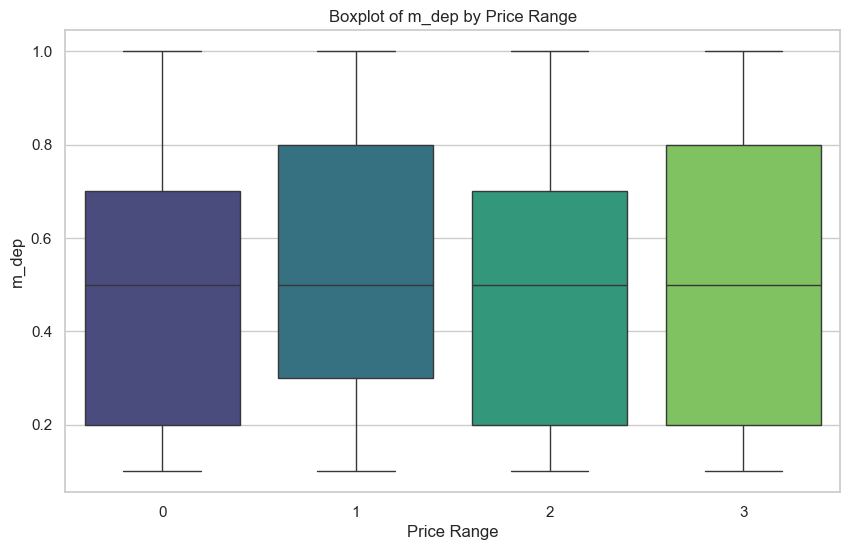

C:\Users\pc\AppData\Local\Temp\ipykernel_23480\317954072.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_data, x='price_range', y=col, palette='viridis')


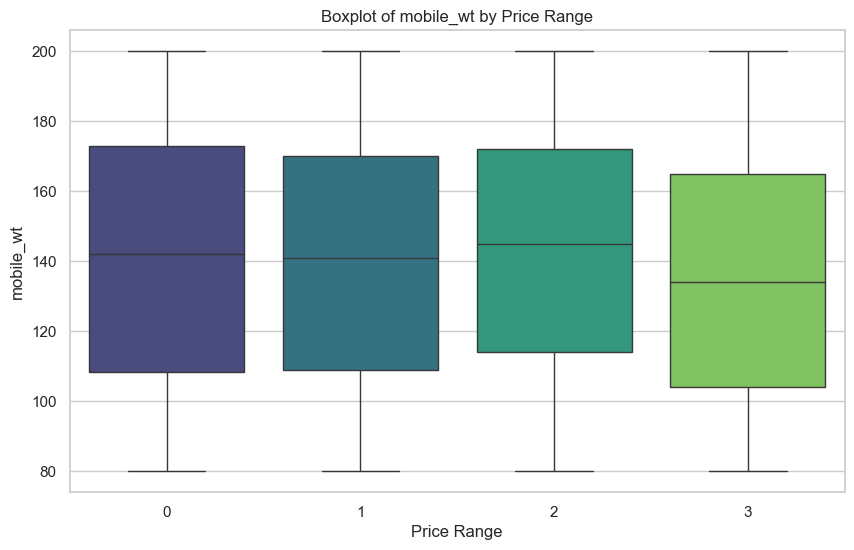

C:\Users\pc\AppData\Local\Temp\ipykernel_23480\317954072.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_data, x='price_range', y=col, palette='viridis')


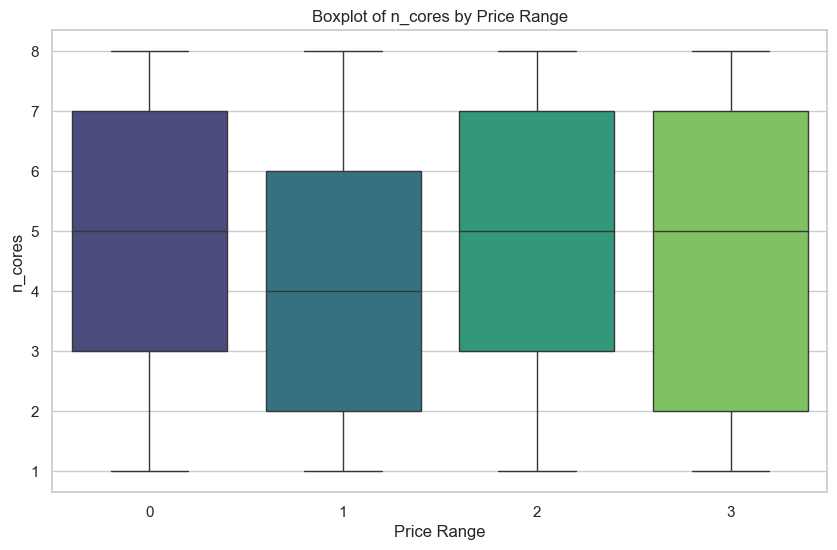

C:\Users\pc\AppData\Local\Temp\ipykernel_23480\317954072.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_data, x='price_range', y=col, palette='viridis')


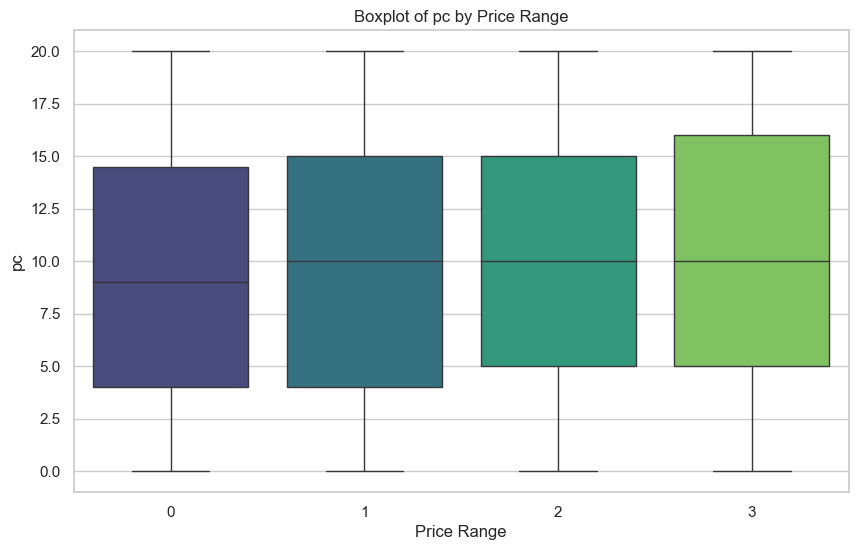

C:\Users\pc\AppData\Local\Temp\ipykernel_23480\317954072.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_data, x='price_range', y=col, palette='viridis')


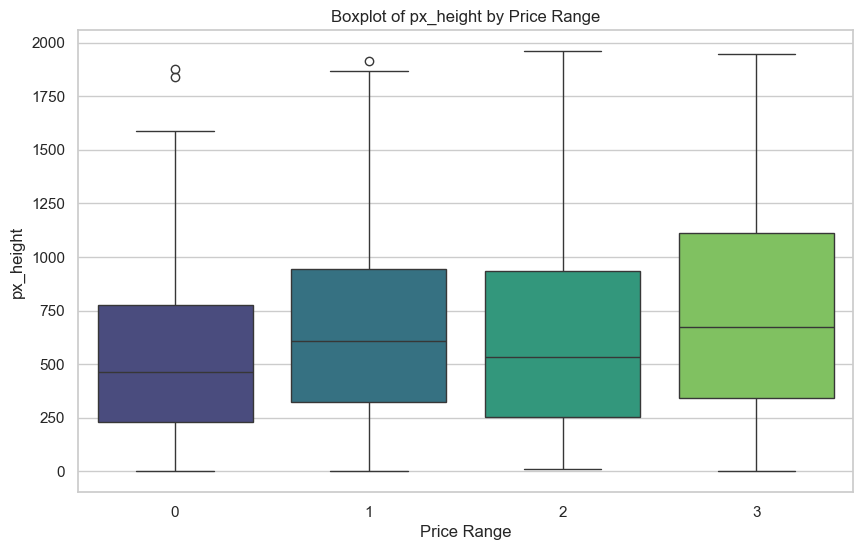

C:\Users\pc\AppData\Local\Temp\ipykernel_23480\317954072.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_data, x='price_range', y=col, palette='viridis')


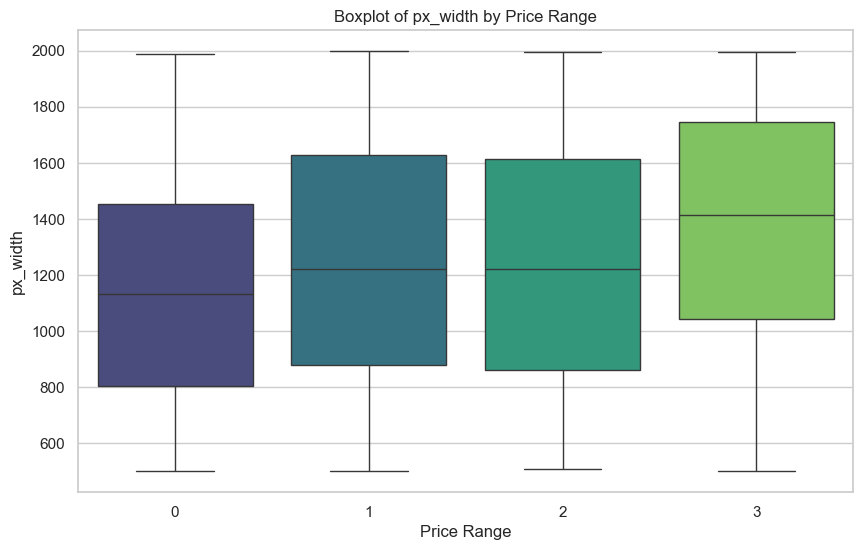

C:\Users\pc\AppData\Local\Temp\ipykernel_23480\317954072.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_data, x='price_range', y=col, palette='viridis')


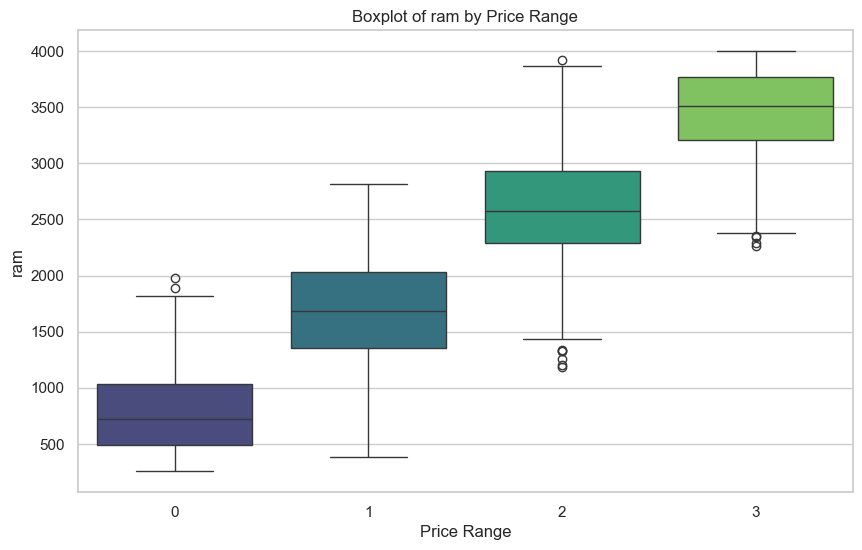

C:\Users\pc\AppData\Local\Temp\ipykernel_23480\317954072.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_data, x='price_range', y=col, palette='viridis')


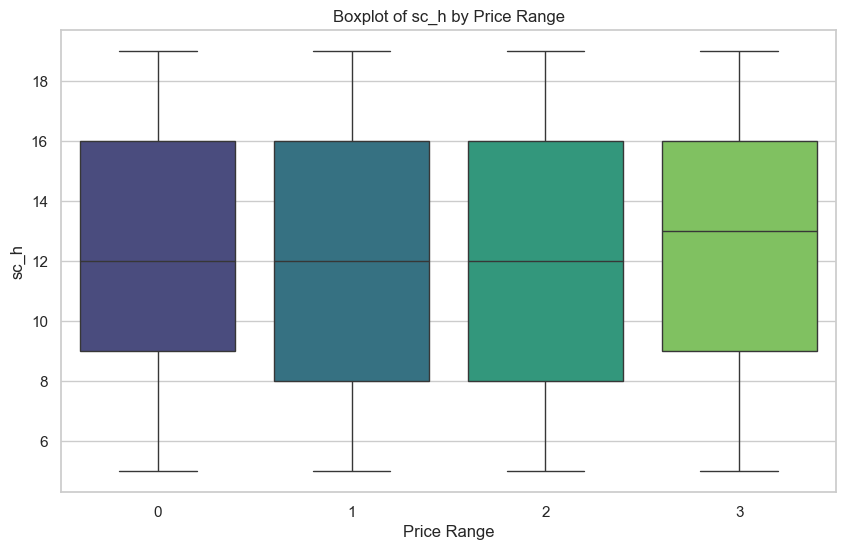

C:\Users\pc\AppData\Local\Temp\ipykernel_23480\317954072.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_data, x='price_range', y=col, palette='viridis')


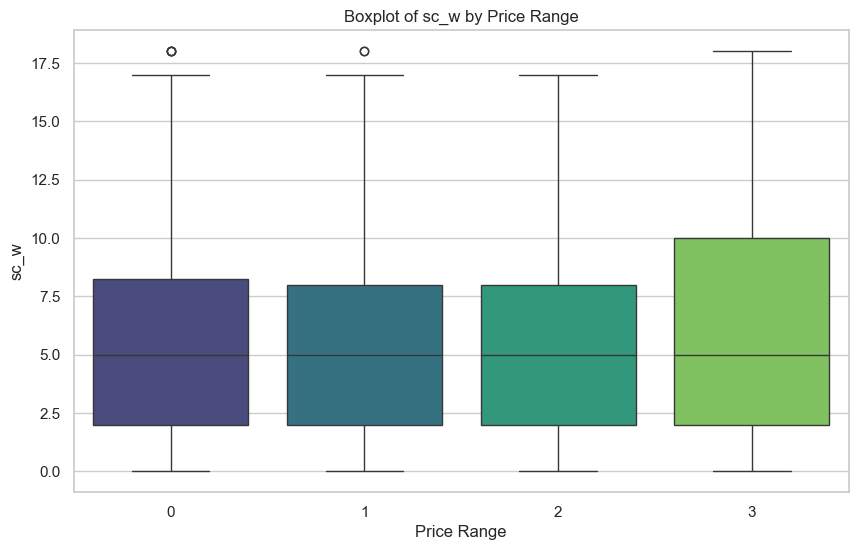

C:\Users\pc\AppData\Local\Temp\ipykernel_23480\317954072.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_data, x='price_range', y=col, palette='viridis')


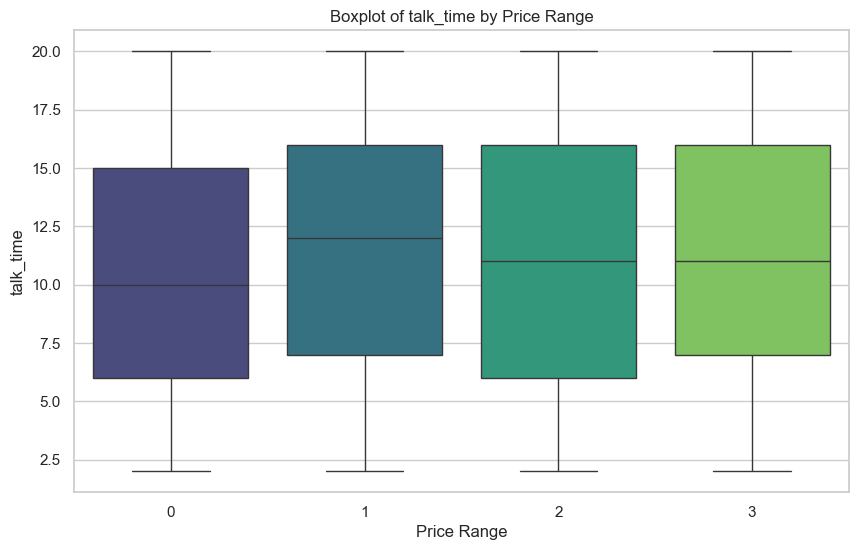

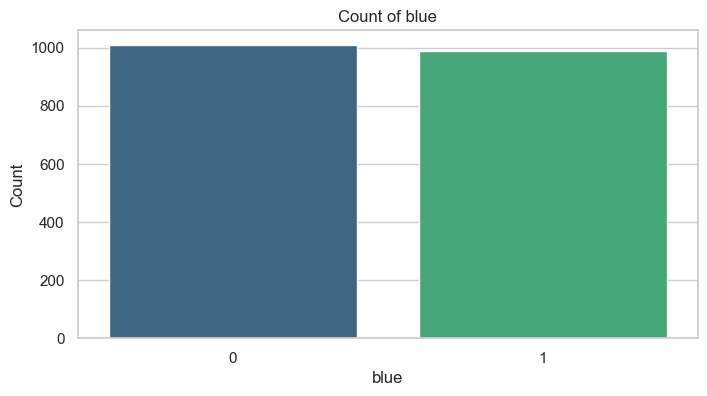

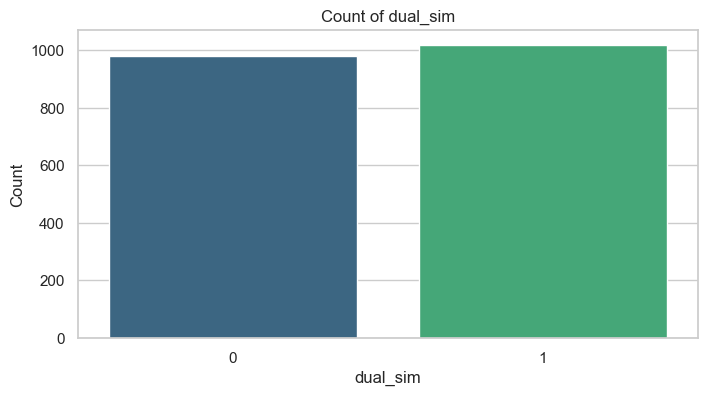

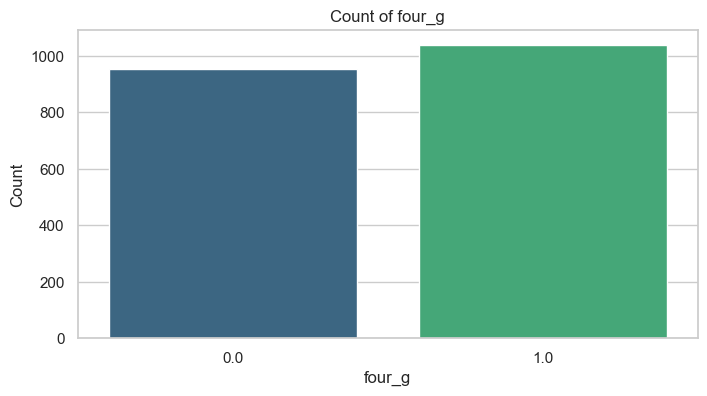

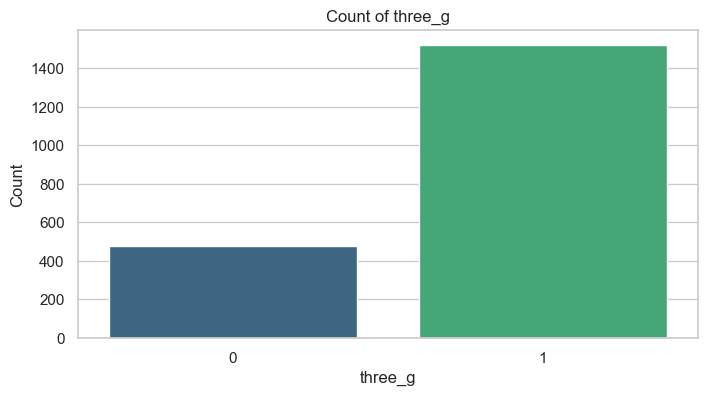

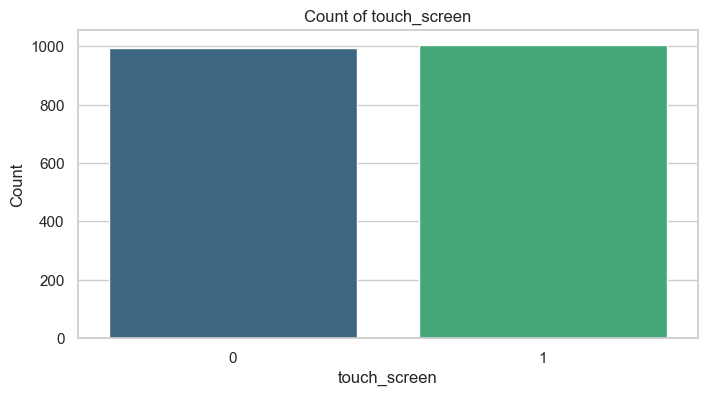

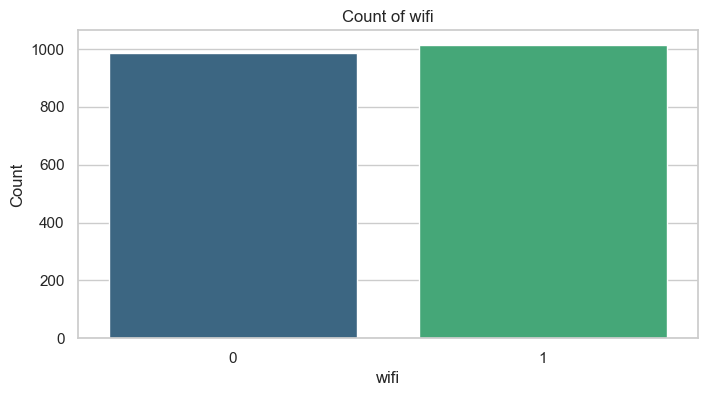

In [6]:
# EDA

# 1. Set the style for the plots
sns.set_theme(style='whitegrid')

# 2. Count of target variable classes
plt.figure(figsize=(8, 6))
sns.countplot(data=train_data, x='price_range', hue='price_range', palette='viridis', legend=False)
plt.title('Count of Price Range Classes')
plt.xlabel('Price Range')
plt.ylabel('Count')
plt.show()

# 3. Correlation Heatmap
plt.figure(figsize=(12, 10))
correlation_matrix = train_data.corr()
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True, cbar_kws={'shrink': .8})
plt.title('Correlation Heatmap')
plt.show()

# 4. Pairplot of features with respect to the target variable
sns.pairplot(train_data, hue='price_range', palette='viridis')
plt.title('Pairplot of Features with Price Range')
plt.show()

# 5. Distribution of Numerical Features
numerical_cols = ['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']

for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(train_data[col], bins=30, kde=True, color='blue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# 6. Boxplots for Numerical Features vs Target Variable
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=train_data, x='price_range', y=col, palette='viridis')
    plt.title(f'Boxplot of {col} by Price Range')
    plt.xlabel('Price Range')
    plt.ylabel(col)
    plt.show()

# 7. Categorical Features Count
categorical_cols = ['blue', 'dual_sim', 'four_g', 'three_g', 'touch_screen', 'wifi']
for col in categorical_cols:
    plt.figure(figsize=(8, 4))
    sns.countplot(data=train_data, x=col, hue=col, palette='viridis', legend=False)
    plt.title(f'Count of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.show()


In [7]:
# Data Preprocessing
# Step 1: Handle Null Values with SimpleImputer
df = train_data.copy()

# Define numerical and categorical columns
numerical_cols = ['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']
categorical_cols = ['blue', 'dual_sim', 'four_g', 'three_g', 'touch_screen', 'wifi']
# Create a preprocessor with transformers for numerical and categorical features
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='mean')),
            ('scaler', StandardScaler())
        ]), numerical_cols),
        ('cat', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='most_frequent')),
            ('onehot', OneHotEncoder(drop='first', handle_unknown='ignore'))
        ]), categorical_cols)
    ]
)

# Step 2: Prepare the Data
X = df.drop('price_range', axis=1)  # Features
y = df['price_range']  # Target variable

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [8]:
# Define Models and Hyperparameters
models = {
    'Logistic Regression': (LogisticRegression(max_iter=1000), {
        'model__C': [0.01, 0.1, 1, 10],
        'model__solver': ['lbfgs', 'liblinear']  
    }),
    'Decision Tree': (DecisionTreeClassifier(), {
        'model__max_depth': [None, 5, 10, 15],
        'model__min_samples_split': [2, 5, 10]
    }),
    'Random Forest': (RandomForestClassifier(), {
        'model__n_estimators': [10, 50, 100],
        'model__max_depth': [None, 5, 10, 15]
    }),
    'Support Vector Machine': (SVC(), {
        'model__C': [0.01, 0.1, 1, 10],
        'model__kernel': ['linear', 'rbf']
    })
}

In [9]:
# Use Cross-Validation with Pipelines
results = {}

for model_name, (model, params) in models.items():
    # Create a pipeline that first transforms the data, then fits the model
    pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', model)])
    
    # Use GridSearchCV for hyperparameter tuning
    grid_search = GridSearchCV(pipeline, params, cv=5, scoring='accuracy', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    # Save the best model and its score
    results[model_name] = {
        'best_score': grid_search.best_score_,
        'best_params': grid_search.best_params_,
        'best_estimator': grid_search.best_estimator_
    }

In [10]:
# Save the pipeline
with open('artifacts/best_pipeline.pkl', 'wb') as pipeline_file:
    pickle.dump(grid_search.best_estimator_, pipeline_file)
    
print("Pipeline saved successfully.")

Pipeline saved successfully.


Logistic Regression: Best Score = 0.9569, Best Params = {'model__C': 10, 'model__solver': 'lbfgs'}
Decision Tree: Best Score = 0.8375, Best Params = {'model__max_depth': 10, 'model__min_samples_split': 2}
Random Forest: Best Score = 0.8731, Best Params = {'model__max_depth': None, 'model__n_estimators': 100}
Support Vector Machine: Best Score = 0.9569, Best Params = {'model__C': 10, 'model__kernel': 'linear'}
Confusion Matrix:
[[101   4   0   0]
 [  0  91   0   0]
 [  0   1  88   3]
 [  0   0   2 110]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98       105
           1       0.95      1.00      0.97        91
           2       0.98      0.96      0.97        92
           3       0.97      0.98      0.98       112

    accuracy                           0.97       400
   macro avg       0.97      0.98      0.97       400
weighted avg       0.98      0.97      0.98       400



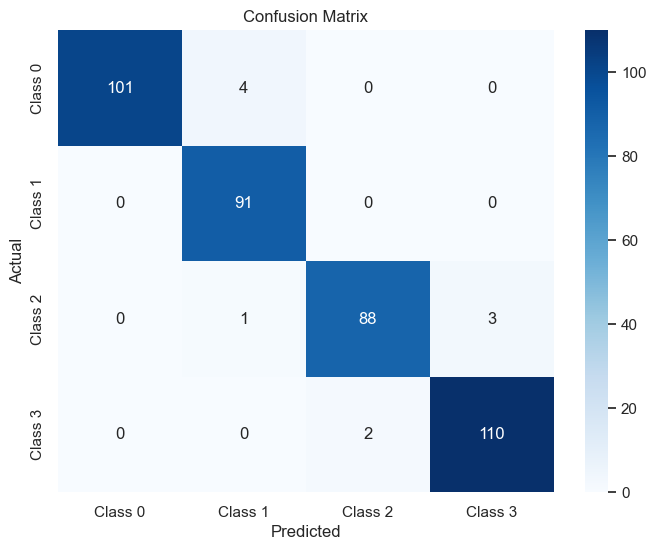

In [11]:
# Select the Best Model
for name, result in results.items():
    print(f"{name}: Best Score = {result['best_score']:.4f}, Best Params = {result['best_params']}")

best_model = max(results.items(), key=lambda x: x[1]['best_score'])[1]['best_estimator']
y_pred = best_model.predict(X_val)

# Print evaluation metrics
print("Confusion Matrix:")
conf_matrix = confusion_matrix(y_val, y_pred)
print(conf_matrix)
print("\nClassification Report:")
print(classification_report(y_val, y_pred))

# Confusion Matrix Visualization
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1', 'Class 2', 'Class 3'], yticklabels=['Class 0', 'Class 1', 'Class 2', 'Class 3'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

In [12]:
# Load the saved pipeline
with open('artifacts/best_pipeline.pkl', 'rb') as pipeline_file:
    pipeline = pickle.load(pipeline_file)

# Load and prepare data
device_df = train_data.copy()
X = device_df.drop('price_range', axis=1)
y = device_df['price_range']

# Predict directly with the loaded pipeline
predictions = pipeline.predict(X)

# Print the classification report
print(classification_report(y, predictions))


              precision    recall  f1-score   support

           0       0.99      0.98      0.99       500
           1       0.97      0.98      0.97       500
           2       0.98      0.97      0.97       500
           3       0.99      0.99      0.99       500

    accuracy                           0.98      2000
   macro avg       0.98      0.98      0.98      2000
weighted avg       0.98      0.98      0.98      2000

